<a href="https://colab.research.google.com/github/edilsondesouza/covid19/blob/main/DataViz_DCC_UFMG_COVID19_Lucas_Edilson.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

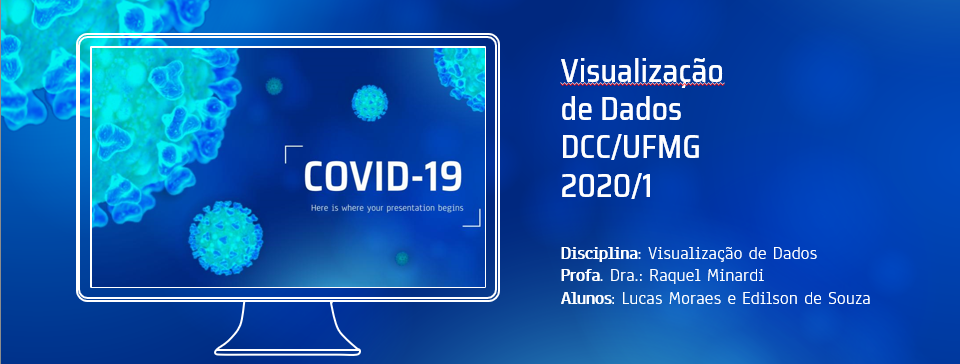



---


<h1>Visualização de Dados
- DCC/UFMG 2020/1 - Projeto Final  </h1>


---




---


<b>Disciplina</b>: Visualização de Dados                                
<b>Profa. Dra.</b>: Raquel Minardi             
<b>Alunos</b>: Lucas Moraes e Edilson de Souza

Contatos:

<li> moraes.lsantos@gmail.com </li>
<li> edilson.souza@gmail.com </li>

---



Assista o vídeo de apresentação disponivel em:
 <a href="https://www.youtube.com/">Video Final</a> 



---


<h3><i><b> “Não podemos dizer isso em voz alta ou clara 
o suficiente ou com frequência suficiente: 
Todos os países ainda podem mudar o curso desta pandemia.” <i><b> <h3> 
<p></p>
<p></p>

—DR. TEDROS ADHANOM GHEBREYESUS,  DIRETOR-GERAL DA ORGANIZAÇÃO MUNDIAL DA SAÚDE


---





---



## <strong>1. Proposta de Projeto</strong>

Estudos relacionados a pandemia COVID-19 tem no atual momento extrema relevância nos aspectos sociais, econômicos e de saúde pública que a situação impõe a sociedade mundial.  

Cientistas no mundo todo buscam compreender a cada dia o mecanismo de propagação do vírus na intenção de encontrar medicamentos, ou ainda uma vacina, eficiente. Dentre algumas candidatas a vacina (em estágio avançado de testes clínicos), podemos citar as desenvolvidas pela Moderna/NIAID (EUA), Sinovac (China) e Oxford/AstraZeneca (Reino Unido) estas últimas estando na terceira fase, ambas sendo testadas no Brasil.

Apesar da alta visibilidade e contingente de profissionais especializados tratando o tema, não é possível encontrar plataformas de visualização de dados que forneçam uma análise sistêmica, além de se observar um viés claro para reporte dos números absolutos de novos casos e mortes.

Dentre os mais renomados sites de divulgação de informações relativas à COVID-19 destaca-se o da Universidade John Hopkins (EUA) e o site mantido pela Universidade de Oxford (RU), Our World in Data. Em ambos podemos encontrar visualizações com grande foco nos números absolutos e com poucas correlações entre as informações publicadas, como exemplificado na figura abaixo.



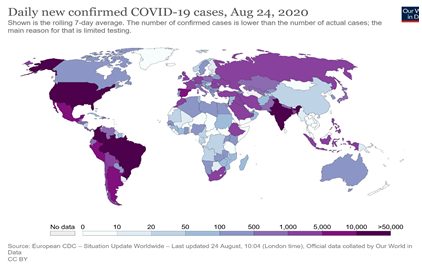

Nessa linha, o presente trabalho busca integrar visualmente e correlacionar as informações disponíveis na base de dados do Our World in Data, uma vez que a mesma apresenta uma abrangência de informações maior que as demais analisadas, sendo utilizadas como fonte de informações tanto para pesquisa quanto para ensino em renomadas universidades como Stanford, Harvard e MIT, além da própria Universidade de Oxford, provedora dos dados deste projeto.


Com o trabalho, pretendemos apresentar uma ferramenta para visualização dos dados relacionados a pandemia de COVID-19 que possibilite a análise de outras informações em relação ao comportamento da doença no mundo, que outras plataformas disponíveis atualmente não abarcam. 




Análises, como as elencadas abaixo, não são facilmente possibilitadas por grande parte das visualizações disponíveis na web, sendo estes os desafios que o presente trabalho pretende responder:


1. Como o número de novos casos evolui, com base no rigor das políticas de isolamento implementadas por cada país?
2. Como a velocidade de aplicação de testes tem influenciado na contenção da doença?
3. A população socialmente vulnerável está sendo mais afetada?
4. Existem outros agrupamentos ainda não explorados suficientemente? (etnia, sexo, etc...)
5. É possível elaborar visualizações de fácil entendimento que reflitam melhor a situação de cada país?
6. É possível explicar causas de aceleração ou desaceleração de propagação do vírus com os dados coletados?



---


## 2. Base de Dados


A base de dados a ser utilizada é a  <a href="https://github.com/owid/covid-19-data/tree/master/public/data"> Our World in Data </a> </li> COVID-19 dataset  e consta de dados atualizados diariamente sobre a pandemia dentre eles:

<ul>
<li>Número de novos casos;
<li>Número de casos por milhão;
<li>Número de mortes;
<li>Número de mortes por milhão;
<li>Número total de testes;
<li>Indice Stringency (Oxford);
<li>Idade média;
<li>Percentual da população acima de 65 anos;
<li>PIB per capita;
<li>População com diabetes;
<li>População com doenças cardiovasculares </ul>
<p><p>



A lista completa de attributos segue abaixo:

In [131]:
!pip install datapackage

In [132]:
#Import Libraries
import os
import csv

import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
from matplotlib import dates as mpl_dates
import datapackage

#Import COVID-19 Dataset
df = pd.read_csv("https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv")
df['date'] = pd.to_datetime(df['date'])
df['total_cases'] = pd.to_numeric(df['total_cases'], downcast="float")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52873 entries, 0 to 52872
Data columns (total 41 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   iso_code                         52571 non-null  object        
 1   continent                        52269 non-null  object        
 2   location                         52873 non-null  object        
 3   date                             52873 non-null  datetime64[ns]
 4   total_cases                      49259 non-null  float32       
 5   new_cases                        51979 non-null  float64       
 6   new_cases_smoothed               51185 non-null  float64       
 7   total_deaths                     40323 non-null  float64       
 8   new_deaths                       51979 non-null  float64       
 9   new_deaths_smoothed              51185 non-null  float64       
 10  total_cases_per_million          48993 non-null  float64  

Segue abaixo uma amostra dos dados utilizados:

In [133]:
#EDA
df.describe()

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
count,4.925900e+04,51979.000000,51185.000000,4.032300e+04,51979.000000,51185.000000,48993.000000,51915.000000,51120.000000,40072.000000,51915.000000,51120.000000,2.000700e+04,1.984400e+04,20007.000000,19844.000000,2.222000e+04,22220.000000,20536.000000,20880.000000,43997.000000,5.257100e+04,50123.000000,47079.000000,46373.000000,46834.000000,46455.000000,30975.000000,47052.000000,48759.000000,36694.000000,36223.000000,22198.000000,42423.000000,51899.000000,45419.000000
mean,1.409258e+05,1677.496162,1651.444335,6.250125e+03,44.669944,44.711919,2595.355340,31.403145,30.431950,86.781450,0.599515,0.595137,1.983100e+06,2.622948e+04,68.292012,0.837251,2.533850e+04,0.816181,189.524658,0.064825,56.885701,8.671548e+07,361.687316,31.241566,9.208953,5.820891,20738.334318,12.313866,252.097431,8.056455,10.766787,32.640266,52.238712,3.096829,73.971738,0.723251
std,1.412620e+06,15189.870684,14824.252952,5.063745e+04,371.987801,361.758061,5120.407744,111.964876,77.227381,171.107043,2.948788,1.867705,9.016516e+06,1.070339e+05,136.065137,1.555860,9.886533e+04,1.405019,906.136188,0.087514,26.571727,6.061541e+08,1648.120498,9.038314,6.305218,4.302602,20363.762997,19.350503,117.408213,4.157835,10.475180,13.442636,31.629401,2.519185,7.389685,0.153115
min,1.000000e+00,-8261.000000,-552.000000,1.000000e+00,-1918.000000,-232.143000,0.001000,-2212.545000,-269.978000,0.000000,-67.901000,-9.678000,1.000000e+00,-3.743000e+03,0.000000,-0.398000,0.000000e+00,0.000000,1.535000,0.000000,0.000000,8.090000e+02,0.137000,15.100000,1.144000,0.526000,661.240000,0.100000,79.370000,0.990000,0.100000,7.700000,1.188000,0.100000,53.280000,0.354000
25%,1.470000e+02,0.000000,0.714000,1.100000e+01,0.000000,0.000000,75.908000,0.000000,0.212000,3.471000,0.000000,0.000000,5.570950e+04,1.007750e+03,3.532500,0.069000,1.099000e+03,0.071000,11.321000,0.009000,38.890000,1.399491e+06,37.728000,23.200000,3.552000,2.085000,5338.454000,0.500000,155.898000,5.310000,1.900000,21.400000,21.222000,1.300000,69.870000,0.601000
50%,1.795000e+03,12.000000,17.714000,7.400000e+01,0.000000,0.286000,501.409000,1.921000,3.514000,18.111500,0.000000,0.025000,2.374640e+05,3.478500e+03,18.003000,0.318000,3.877000e+03,0.330000,31.898000,0.030000,61.110000,8.278737e+06,88.125000,31.100000,6.981000,4.393000,14048.881000,2.000000,238.339000,7.110000,6.400000,31.400000,52.232000,2.500000,75.400000,0.754000
75%,1.773350e+04,200.000000,210.000000,6.260000e+02,3.000000,3.571000,2899.605000,22.371000,25.299750,74.315750,0.249000,0.357000,9.408365e+05,1.289850e+04,74.688000,0.974250,1.376350e+04,0.982000,102.975250,0.087000,78.700000,2.982597e+07,214.243000,39.700000,14.762000,9.395000,31400.840000,18.100000,318.991000,10.390000,19.600000,40.900000,83.741000,4.200000,79.380000,0.847000
max,4.359803e+07,482596.000000,439849.143000,1.160995e+06,10491.000000,7456.857000,55976.186000,8652.658000,2472.188000,1237.551000,215.382000,63.140000,1.600000e+08,1.492409e+06,1607.388000,25.983000,1.196972e+06,19.111000,45864.000000,0.651000,100.000000,7.794799e+09,19347.500000,48.200000,27.049000,18.493000,116935.600000,77.600000,724.417000,23.360000,44.000000,78.100000,98.999000,13.800000,86.750000,0.953000




---


## 3. Método e Ferramentas

<b> Mètodo </b> <br><br>
Para desenvolver o projeto utilizamos o método que consiste basicamente no refinamento das questões propostas neste documento, coleta dos dados da fonte supra-citada, bem como demais fontes alternativas que se fizerem necessárias, limpeza e análise ad-hoc dos dados com relação a completude e contexto. Análise exploratória de dados com estatísticas mais aprofundadas e identificação de padrões eventualmente detectados, elaboração das visualizações de dados. Elaboração de visualizações no ambiente sand-box (PowerBI) para seleção das melhores visualizações que responderem as perguntas refinadas.

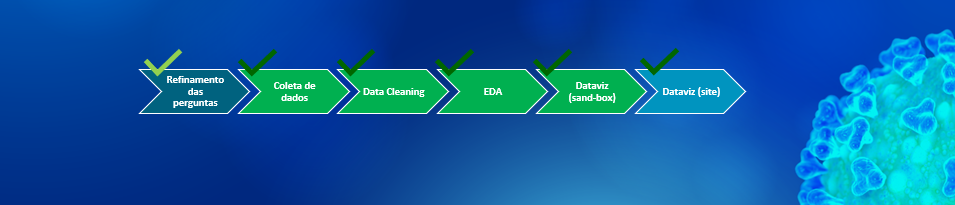

<b> Ferramentas </b> <br><br>
Para executar o método proposto elegemos as seguintes ferramentas para o projeto:

*  Github: Código fonte
*  Python: Linguagem de programação utilizada
*  Matplotlib: Biblioteca para visualização de dados
*  Plotly: Biblioteca para visualização de dados
*  Microsoft PowerBI: Para elaboração das visualizações sand-box
*  Microsoft Teams: Documentação, reuniões e colaboração
*  OBS Studio: Criação do vídeo de apresentação
*  Youtube: Publicação dos vídeos do projeto




---


## 4. Resultados

Inicialmente foram feitos gráficos exploratórios como os exibidos abaixo com o fim de testar a primeira biblioteca utilizada (Matplotlib). O primeiro gráfico se refere ao numero total de casos e o segundo ao número de mortes.

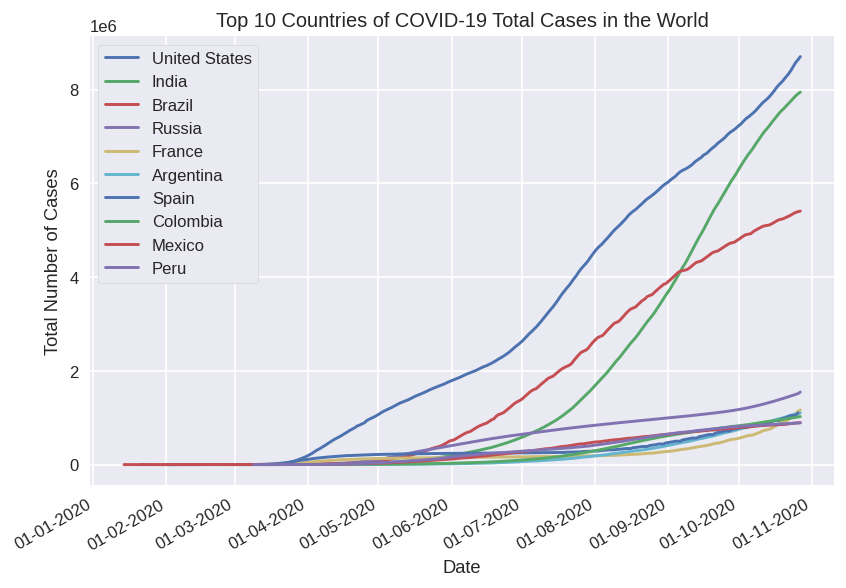

In [134]:
# -----------------------------------------------------------------------

# Total Cases Current Top 10 Countries

countries = ['United States', 'India', 'Brazil','Russia','France','Argentina', 'Spain','Colombia','Mexico', 'Peru']

plt.style.use('seaborn')

for country in countries:

	df_rem = df.loc[(df['location']==country)]
	date = df_rem['date']
	total_cases = df_rem['total_cases']
	plt.plot(date, total_cases, linestyle='solid', label=country)

plt.rcParams['figure.dpi'] = 120

plt.gcf().autofmt_xdate()
date_format = mpl_dates.DateFormatter('%d-%m-%Y')
plt.gca().xaxis.set_major_formatter(date_format)


plt.title('Top 10 Countries of COVID-19 Total Cases in the World')
plt.xlabel('Date')
plt.ylabel('Total Number of Cases')
plt.legend(framealpha=1, frameon=True);
plt.show()





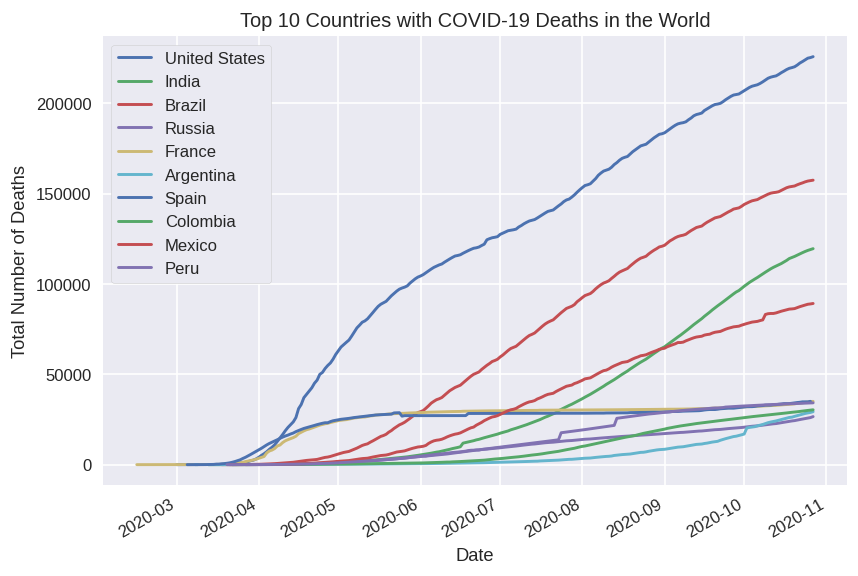

In [135]:
# -----------------------------------------------------------------------

# Total Deaths

plt.style.use('seaborn')

for country in countries:

	df_rem = df.loc[(df['location']==country)]
	date = df_rem['date']
	total_cases = df_rem['total_deaths']
	plt.plot(date, total_cases, linestyle='solid', label=country)

plt.rcParams['figure.dpi'] = 120
plt.gcf().autofmt_xdate()
#date_format = mpl_dates.DateFormatter('%d-%m-%Y')
#plt.gca().xaxis.set_major_formatter(date_format)

plt.title('Top 10 Countries with COVID-19 Deaths in the World')
plt.xlabel('Date')
plt.ylabel('Total Number of Deaths')
plt.legend(framealpha=1, frameon=True);
plt.show()


Em seguida, e com vista as perguntas a serem respondidas, evoluimos a análise para os seguintes gráficos, que respondem as perguntas 1 e 6. 


**1.Como o número de novos casos evolui, com base no rigor das políticas de isolamento implementadas por cada país?**

**6.É possível explicar causas de aceleração ou desaceleração de propagação do vírus com os dados coletados?**
<p><p>
 Conforme gráfico abaixo, é possivel perceber que o índice de rigor (Stringency index) na aplicação das políticas publicas de contenção da pandemia, e um relaxamento temerário das mesmas políticas leva a um aumento no numero de casos de forma contundente em países Alemanha, França. Já no caso do Brasil isto não é percebido. Percebe-se também nos gráficos que acelerações do numero de caso tem ocorrido quando estas políticas são relaxadas.


<Figure size 960x660 with 0 Axes>

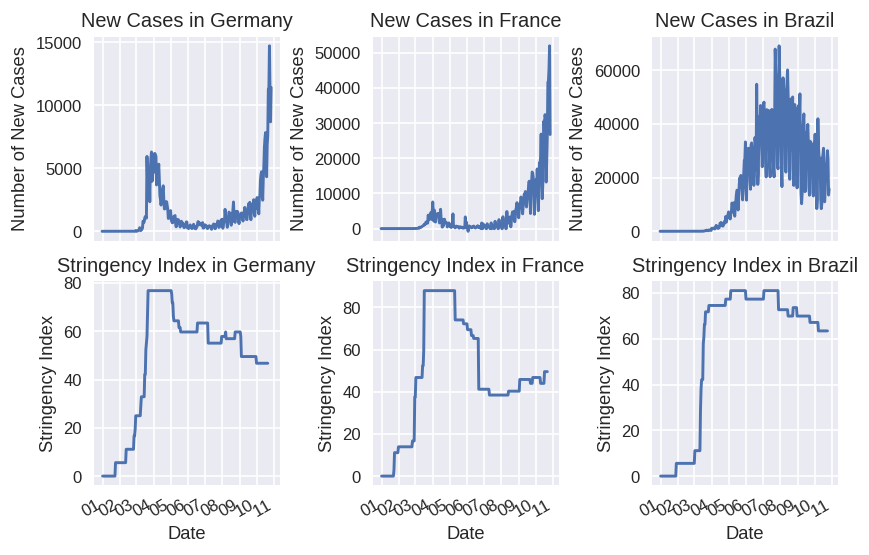

In [136]:
# -----------------------------------------------------------------------

# New Cases x Stringency Index 

countries = ['Germany','France','Brazil']

figure = plt.figure()

figure, axes = plt.subplots(nrows = 2, ncols = 3, sharex=True, sharey=False)

i=0
for country in countries:
	
  df_rem = df.loc[(df['location']==country)]
  date = df_rem['date']
  new_cases = df_rem['new_cases']
  stringency_index = df_rem['stringency_index']

  axes[0][i].plot(date, new_cases, linestyle='solid', label=country)
  plt.rcParams['figure.dpi'] = 120
  plt.gcf().autofmt_xdate()
  date_format = mpl_dates.DateFormatter('%d-%m-%Y')
  plt.gca().xaxis.set_major_formatter(date_format)

  axes[0][i].set_title('New Cases in '+country)
  axes[0][i].set_xlabel('Date')
  axes[0][i].set_ylabel('Number of New Cases')
  #axes[1][i].legend(framealpha=1, frameon=True);

	#df_rem = df.loc[(df['location']==country)]
	#date = df_rem['date']

  axes[1][i].plot(date, stringency_index, linestyle='solid', label=country)

  plt.gcf().autofmt_xdate()
  date_format = mpl_dates.DateFormatter('%m')
  plt.gca().xaxis.set_major_formatter(date_format)

  axes[1][i].set_title('Stringency Index in '+country)
  axes[1][i].set_xlabel('Date')
  axes[1][i].set_ylabel('Stringency Index')
  #axes[1][i].legend(framealpha=1, frameon=True)

  i+=1

plt.subplots_adjust(wspace=0.5)
plt.show()	

#exit()


Já as perguntas 2 a 5 são respondidas pelos gráficos abaixo:

**2. Como a velocidade de aplicação de testes tem influenciado na contenção da doença?**

Pelos gráficos abaixo mostra-se pouca efetivamente na contenção da doença via testes, apesar de ter efeito enviesado pelo fato de aumentar o numero de casos confirmados em comparação com países que não testaram suficientemente. Os testes contudo combinados a politicas de restrição mais rigidas tiveram bons resultados na contenção da pandemia.

<Figure size 960x660 with 0 Axes>

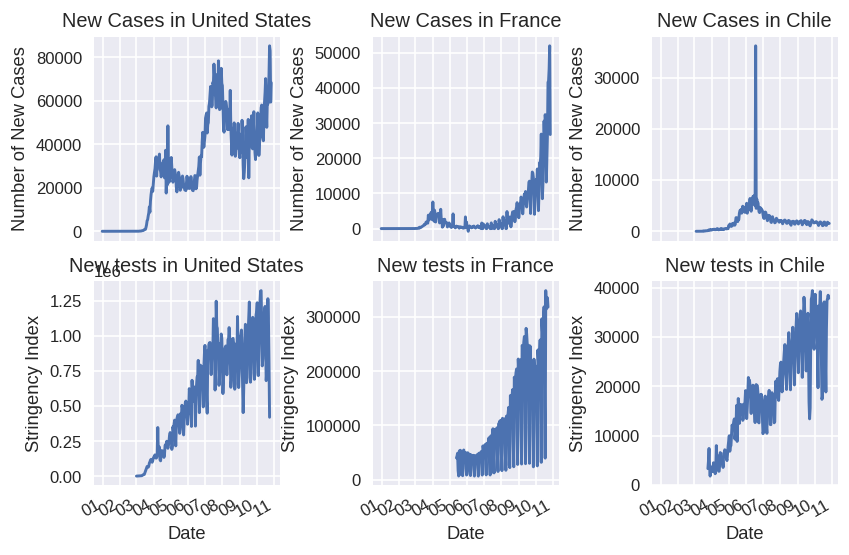

In [137]:
#New cases x New tests
countries = ['United States','France','Chile']

figure = plt.figure()

figure, axes = plt.subplots(nrows = 2, ncols = 3, sharex=True, sharey=False)

i=0
for country in countries:
	
  df_rem = df.loc[(df['location']==country)]
  date = df_rem['date']
  new_cases = df_rem['new_cases']
  stringency_index = df_rem['new_tests']

  axes[0][i].plot(date, new_cases, linestyle='solid', label=country)
  plt.rcParams['figure.dpi'] = 120
  plt.gcf().autofmt_xdate()
  date_format = mpl_dates.DateFormatter('%m')
  plt.gca().xaxis.set_major_formatter(date_format)

  axes[0][i].set_title('New Cases in '+country)
  axes[0][i].set_xlabel('Date')
  axes[0][i].set_ylabel('Number of New Cases')
  #axes[1][i].legend(framealpha=1, frameon=True);

	#df_rem = df.loc[(df['location']==country)]
	#date = df_rem['date']

  axes[1][i].plot(date, stringency_index, linestyle='solid', label=country)

  plt.gcf().autofmt_xdate()
  date_format = mpl_dates.DateFormatter('%m')
  plt.gca().xaxis.set_major_formatter(date_format)

  axes[1][i].set_title('New tests in '+country)
  axes[1][i].set_xlabel('Date')
  axes[1][i].set_ylabel('Stringency Index')
  #axes[1][i].legend(framealpha=1, frameon=True)

  i+=1

plt.subplots_adjust(wspace=0.5)
plt.show()	

#exit()

No gráfico é possivel ver a relação entre os continentes e os testes aplicados nos mesmos.

In [138]:
import plotly.express as px
#df = px.data.iris()

countries = ['United States']

#for country in countries:

#	df_rem = df.loc[(df['location']==country)]

#fig = px.parallel_categories(df, color="location", color_continuous_scale=px.colors.sequential.Inferno)
#fig.show()


#df = px.data.iris()
'''fig = px.parallel_coordinates(df_rem, color="location", labels={"location": "Location",
                  "new_cases": "NC", "new_deaths": "ND", },
                   color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)
'''
#df = px.data.iris()
#print(df.head())
'''
fig = px.parallel_coordinates(df, color='new_cases', labels={"location": "Location",
                  "new_cases": "new_cases", "new_deaths": "new_deaths",
                  "stringency_index": "SL", "gdp_per_capita": "GDP", },
                    color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)

fig.show()
'''

fig = px.parallel_categories(df, color="stringency_index", color_continuous_scale=px.colors.sequential.Inferno)
fig.show()

**3. A população socialmente vulnerável está sendo mais afetada?**

Como pode ser visto nas figuras abaixo, a população dos países com renda per capita mais baixa sofre com os maiores indices de contaminação quando comparados aos paises com renda per capita elevada.

In [139]:
fig = px.choropleth(df, locations="iso_code",
                    color="gdp_per_capita", 
                    hover_name="location", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

In [140]:

#plt.style.use('seaborn')

countries = ['United States', 'India', 'Brazil','Russia','France','Argentina', 'Spain','Colombia','Mexico', 'Peru']

for country in countries:

	df_rem = df.loc[(df['location']==country)]
	date = df_rem['date']
	total_cases = df_rem['total_deaths']
#	plt.plot(date, total_cases, linestyle='solid', label=country)
  

import plotly.express as px
#df = px.data.iris() # iris is a pandas DataFrame
#fig = px.scatter(df, x="stringency_indexs", y="new_case")
fig = px.scatter(df, x="date", y="new_cases", range_y=[0,150000], color="gdp_per_capita", labels="location")

fig.show()


Este gráfico mostra que dependendo do continente países com PIB per capita baio como foi o caso da Ásia foram duramente atingidos pela pandemia. Ao passo que no continente norte-americano o país com maior PIB per capita foi o mais atingido.

In [141]:
fig = px.scatter(df.query("location!='World' and location!='International'"), x="gdp_per_capita", y="new_cases",
           color="location", hover_name="location", facet_col="continent", range_x = [0,100000]
           )
fig.show()

**4. Existem outros agrupamentos ainda não explorados suficientemente? (etnia, sexo, etc...)**



Pelo gráfico abaixo pode-se ver correlações esperadas entre extrema pobreza, pib per capita e pessoas acima de 65 anos, contudo as correlações com os casos totais de covid não puderam ser verificados na visualização abaixo.

In [142]:
import plotly.express as px
#df = px.data.iris()
fig = px.scatter_matrix(df, dimensions=["gdp_per_capita", "stringency_index", "total_cases", "aged_65_older", "extreme_poverty"], color="location")
fig.show()

**5. É possível elaborar visualizações de fácil entendimento que reflitam melhor a situação de cada país?**
Elaboramos a visualização abaixo que julgamos de fácil entendimento e que melhor reflete a situação de cada país

In [145]:
#new_cases_df = df["new_cases"]
#new_cases_df.dropna()
#new_cases = new_cases_df.astype('int32').dtypes
#date_df=df["date"]
#plt.gcf().autofmt_xdate()
#date_format = mpl_dates.DateFormatter('%m')
#datedf = df["date"][:52269]
#datedf=datedf.convert_dtypes(convert_string=True)

#df_new = df.query("date>='01-01-2020'")
stringency_index = df["stringency_index"].dropna()
locations = df["iso_code"][:len(stringency_index)]
continent=df["continent"][:len(stringency_index)]
location=df["location"][:len(stringency_index)]
#month_df=df["date"][:len(stringency_index)]
#month_only=df["date"][:len(stringency_index)].dt.month
#year_only=df["date"][:len(stringency_index)].dt.year
month_year = pd.to_datetime(df["date"][:len(stringency_index)]).dt.to_period('M')
#print(month_year)
month_year_list=[]

for i in range(len(month_year)):
  month_year_list.append(month_year[i].strftime("%Y-%m"))

#print(month_year_list)

fig = px.scatter_geo(df.query("location!='World' and location!='International'"), locations=locations, color=continent, hover_name=location, size=stringency_index,
               projection="natural earth", animation_frame=month_year_list)
fig.show()



---


## 5. Conclusão

Neste trabalho buscou-se abordar visualizações de dados complementares aos já disponiveis no domínio público trazendo um olhar para questões que ainda carecem de maior visibilidade por parte da população. Análise complementares podem ser exploradas com a mesma base para responder outras questões de interesse amplo e a medida que novas informações forem disponibilizadas por demais fontes de dados públicas. 

Agradecemos a oportunidade dada pela prof. Dra. Raquel Minardi por explorar um tema de relevância global em sua disciplina cujo valor no contexto de Transformação Digital se encontra cada vez mais necessária para compreendermos o mundo com dados.